This is an old blog post, see the newer version in [this post](https://laurentperrinet.github.io/sciblog/posts/2017-03-15-reproducing-olshausens-classical-sparsenet-part-2.html)

 <!-- TEASER_END -->


* In a previous notebook, we tried to reproduce the learning strategy specified in the framework of the [SparseNet algorithm from Bruno Olshausen](http://redwood.berkeley.edu/bruno/sparsenet/). It allows to efficiently code natural image patches by constraining the code to be sparse. We have shown that:

 - one can denoise an image using the learned dictionary
 - that the dictionaries are qualitatively the same,
 - that the efficiency is roughly similar but best when the learning and the coding are set to Orthogonal Matching Pursuit,
 
* However, the dictionaries are qualitatively not the same as the one from the original paper, and this is certainly due to the lack of control in the competition during the learning phase.
* Herein, we re-implement the cooperation mechanism in the dictionary learning routine - this will be then proposed to the main code.
* the goal of this notebooks is to illustrate a [PR to sklearn](https://github.com/scikit-learn/scikit-learn/pull/4693)



In [1]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='svg'
import numpy as np
np.set_printoptions(precision=4, suppress=True)
import pandas as pd
import seaborn as sns
%load_ext autoreload
%autoreload 2

/usr/local/lib/python3.5/site-packages/matplotlib/__init__.py:872: UserWarning: axes.color_cycle is deprecated and replaced with axes.prop_cycle; please use the latter.
  warnings.warn(self.msg_depr % (key, alt_key))
/usr/local/lib/python3.5/site-packages/matplotlib/__init__.py:872: UserWarning: axes.color_cycle is deprecated and replaced with axes.prop_cycle; please use the latter.
  warnings.warn(self.msg_depr % (key, alt_key))


In [2]:
from shl_scripts import SHL
DEBUG_DOWNSCALE, verbose = 1, 100
DEBUG_DOWNSCALE, verbose = 10, 0
DEBUG_DOWNSCALE, verbose = 100, 100
DEBUG_DOWNSCALE, verbose = 1, 0
np.logspace(-3, 0, int(15/(DEBUG_DOWNSCALE)**.3), base=10, endpoint=False)

#shl = SHL(DEBUG_DOWNSCALE=DEBUG_DOWNSCALE, verbose=verbose, eta_homeo=0.001)
#dico = shl.learn_dico()

array([ 0.001 ,  0.0016,  0.0025,  0.004 ,  0.0063,  0.01  ,  0.0158,
        0.0251,  0.0398,  0.0631,  0.1   ,  0.1585,  0.2512,  0.3981,
        0.631 ])

/Users/lolo/pool/libs/numbers/scikit-learn-sparsenet/sklearn/decomposition/dict_learning.py:152: RuntimeWarning:  Orthogonal matching pursuit ended prematurely due to linear
dependence in the dictionary. The requested precision might not have been met.

  copy_Xy=copy_cov).T


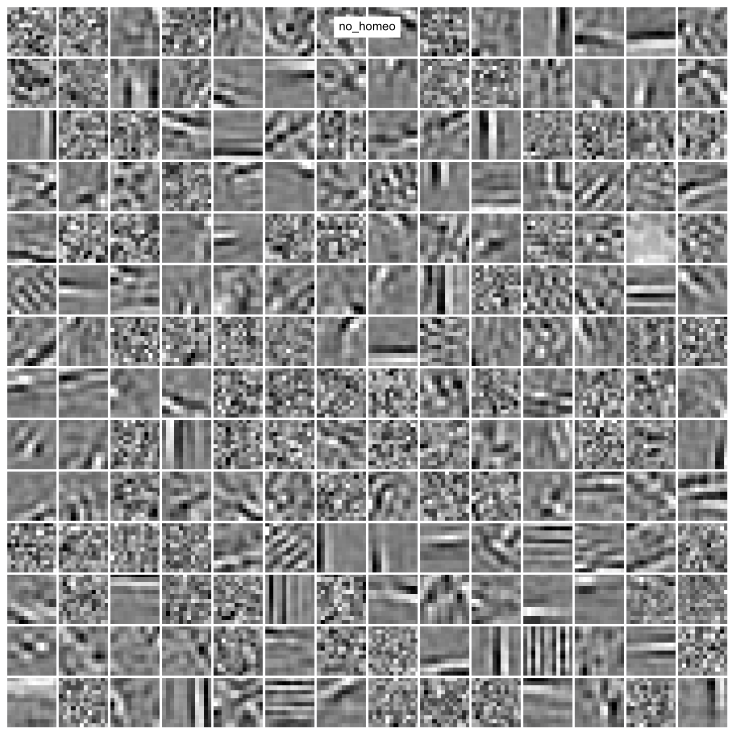

In [3]:
from shl_scripts import SHL
database = '/Users/lolo/pool/science/BICV/SHL_scripts/database/'
DEBUG_DOWNSCALE, verbose = 1, 100
DEBUG_DOWNSCALE, verbose = 100, 0
DEBUG_DOWNSCALE, verbose = 100, 100
DEBUG_DOWNSCALE, verbose = 1, 0
shl = SHL(database=database, DEBUG_DOWNSCALE=DEBUG_DOWNSCALE, verbose=verbose, eta_homeo=0.)
dico = shl.learn_dico()
fig, ax = shl.show_dico(dico, title='no_homeo')
fig.show()

<!-- TEASER_END -->

* In another notebook, we will provide an extension to the SparseNet algorithm. We will study how homeostasis (cooperation) may be an essential ingredient to this algorithm working on a winner-take-all basis (competition). This extension has been published as Perrinet, Neural Computation (2010) (see  https://laurentperrinet.github.io/publication/perrinet-10-shl ).

* find out updates on https://laurentperrinet.github.io/publication/perrinet-19-hulk and https://github.com/bicv/SHL_scripts

## a quick diagnostic

An assumption in the existing code is the way that the norm of the filters is controlled. Here, sklearn simply assumes that $ || V_k ||_2 = 1$,  $\forall k$ (with $0 <= k < n_{components}$). This may be a problem as a dictionary element with a high variance may be more likely to be selected again, and therefore that the learning will concentrate only on a small sub-set of elements. 

In [4]:
data = shl.get_data()
print(shl.max_patches)
dico.set_params(transform_algorithm='omp', transform_n_nonzero_coefs=int(shl.n_components/10))
code = dico.transform(data)

1000


/Users/lolo/pool/libs/numbers/scikit-learn-sparsenet/sklearn/decomposition/dict_learning.py:152: RuntimeWarning:  Orthogonal matching pursuit ended prematurely due to linear
dependence in the dictionary. The requested precision might not have been met.

  copy_Xy=copy_cov).T


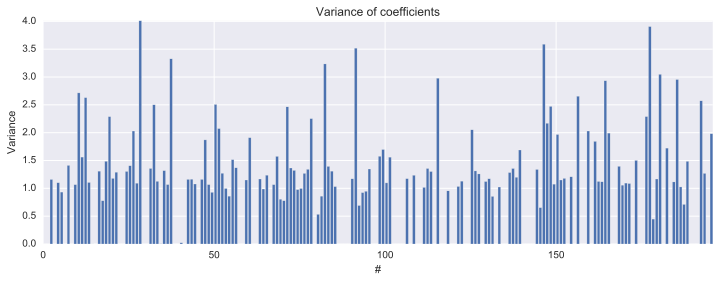

In [5]:
n_components, n_samples = code.shape
Z = np.mean(code**2)
fig = plt.figure(figsize=(12, 4))
ax = fig.add_subplot(111)
ax.bar(np.arange(shl.n_components), np.mean(code**2/Z, axis=0))#, yerr=np.std(code**2/Z, axis=0))
ax.set_title('Variance of coefficients')
ax.set_ylabel('Variance')
ax.set_xlabel('#')
ax.axis('tight')
fig.show()

Worst, this distribution has heavy tails, showing that a small sub-set dominate: this is best shown by showing the correding histogram oif mean variance values:

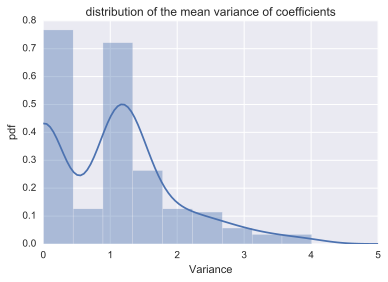

In [6]:
fig = plt.figure(figsize=(6, 4))
ax = fig.add_subplot(111)
data = pd.DataFrame(np.mean(code**2, axis=0)/np.mean(code**2), columns=['Variance'])
with sns.axes_style("white"):
    ax = sns.distplot(data['Variance'],  kde_kws={'clip':(0., 5.)})
ax.set_title('distribution of the mean variance of coefficients')
ax.set_ylabel('pdf')
fig.show()

A strategy used by Olshausen in it's original paper is to include a gain vector which will be used during the learning to control the norm of the dictionary elements. In turn, this will control how these elements learn and allow for a more equilibrated learning. Let's try to implement thatin sklearn's code.

## contributing code to sklearn (1)

The learning code in ``sklearn`` is concentrated in one file (``sklearn/decomposition/dict_learning.py``) that we will modify to use in our extended version of the learning.


- set-up variables

       cd ~/pool/libs/
       github_user='bicv'
       lib='scikit-learn'
       project='sparsenet'
       git clone https://github.com/$github_user/$lib
       cd $lib
       

-  creating a new branch for his project

       git branches
       git remote add $github_user https://github.com/$github_user/$lib

       git checkout -b $project

- installing the library in dev mode:

       pip uninstall $lib
       pip install -e .

- making the one line change to moviepy's code and test it with the minimum working example above:

       mvim sklearn/decomposition/dict_learning.py


More details on ``MiniBatchDictionaryLearning``:
 
 - doc page: http://scikit-learn.org/0.13/modules/generated/sklearn.decomposition.MiniBatchDictionaryLearning.html
 - source code : https://github.com/scikit-learn/scikit-learn/blob/bb39b49/sklearn/decomposition/dict_learning.py#L1018

## great, let's try that new version  of the algorithm

What differs from the original algorithm is mainly 


Note that we did not need to modify the OMP routine as it uses the gram matrix.

/Users/lolo/pool/libs/numbers/scikit-learn-sparsenet/sklearn/decomposition/dict_learning.py:152: RuntimeWarning:  Orthogonal matching pursuit ended prematurely due to linear
dependence in the dictionary. The requested precision might not have been met.

  copy_Xy=copy_cov).T


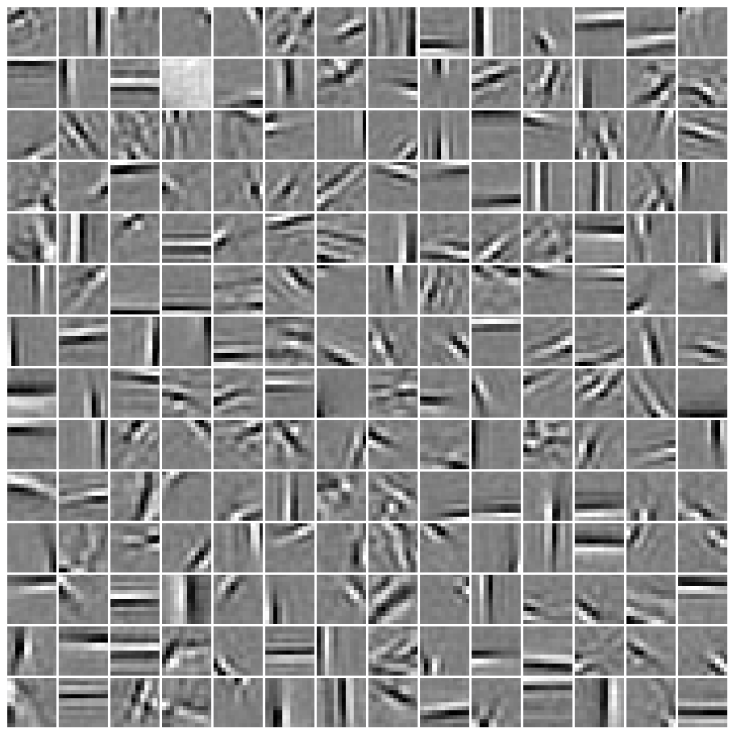

In [7]:
from shl_scripts import SHL
shl = SHL(database=database, DEBUG_DOWNSCALE=DEBUG_DOWNSCALE, verbose=verbose, eta_homeo=0.01)
dico = shl.learn_dico()
fig, ax = shl.show_dico(dico)
fig.show()

This dictionary looks better and similar to that of Olshausen.

Let's now check the mean variance of the different components (remember it is the same coding algorithm):

In [8]:
data = shl.get_data()
dico.set_params(transform_algorithm='omp', transform_n_nonzero_coefs=shl.transform_n_nonzero_coefs)
code = dico.transform(data)

/Users/lolo/pool/libs/numbers/scikit-learn-sparsenet/sklearn/decomposition/dict_learning.py:152: RuntimeWarning:  Orthogonal matching pursuit ended prematurely due to linear
dependence in the dictionary. The requested precision might not have been met.

  copy_Xy=copy_cov).T


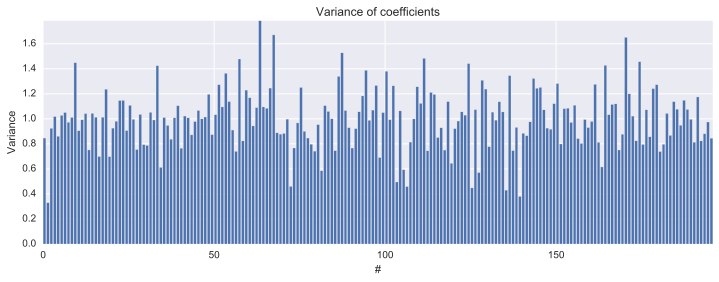

In [9]:
n_components, n_samples = code.shape
Z = np.mean(code**2)
fig = plt.figure(figsize=(12, 4))
ax = fig.add_subplot(111)
ax.bar(np.arange(shl.n_components), np.mean(code**2/Z, axis=0))
ax.set_title('Variance of coefficients')
ax.set_ylabel('Variance')
ax.set_xlabel('#')
ax.axis('tight')
fig.show()

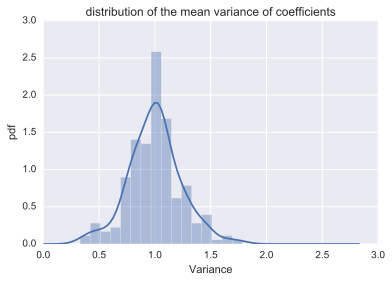

In [10]:
fig = plt.figure(figsize=(6, 4))
ax = fig.add_subplot(111)
data = pd.DataFrame(np.mean(code**2, axis=0)/np.mean(code**2), columns=['Variance'])
with sns.axes_style("white"):
    ax = sns.distplot(data['Variance'],  kde_kws={'clip':(0., 5.)})
ax.set_title('distribution of the mean variance of coefficients')
ax.set_ylabel('pdf')
fig.show()

## contributing code to sklearn (2)

Works as expected! Let's try to do a pull request

-  publishing results

       git status
       git commit -am" making dictionary learning closer to the SparseNet algorithm \n The dictionary learning algorithm was assuming that the norm of the filters was equal to one. By using a heuristic to control for the norm of the filters, we allow for a more equilibrated learning. The implementation is a simplification of the one used in the original paper from Olshausen."
       git push $github_user $project


-  confirm the pull request

       open https://github.com/$github_user/$lib

-  come back to the ``master`` branch

       git checkout master


## scanning some parameters

Let's explore the dictionaries obtained when modifyng some of the parameters of the OMP algorithm.


/Users/lolo/pool/libs/numbers/scikit-learn-sparsenet/sklearn/decomposition/dict_learning.py:152: RuntimeWarning:  Orthogonal matching pursuit ended prematurely due to linear
dependence in the dictionary. The requested precision might not have been met.

  copy_Xy=copy_cov).T
/Users/lolo/pool/libs/numbers/scikit-learn-sparsenet/sklearn/decomposition/dict_learning.py:152: RuntimeWarning:  Orthogonal matching pursuit ended prematurely due to linear
dependence in the dictionary. The requested precision might not have been met.

  copy_Xy=copy_cov).T
/Users/lolo/pool/libs/numbers/scikit-learn-sparsenet/sklearn/decomposition/dict_learning.py:152: RuntimeWarning:  Orthogonal matching pursuit ended prematurely due to linear
dependence in the dictionary. The requested precision might not have been met.

  copy_Xy=copy_cov).T
/Users/lolo/pool/libs/numbers/scikit-learn-sparsenet/sklearn/decomposition/dict_learning.py:152: RuntimeWarning:  Orthogonal matching pursuit ended prematurely due to linea

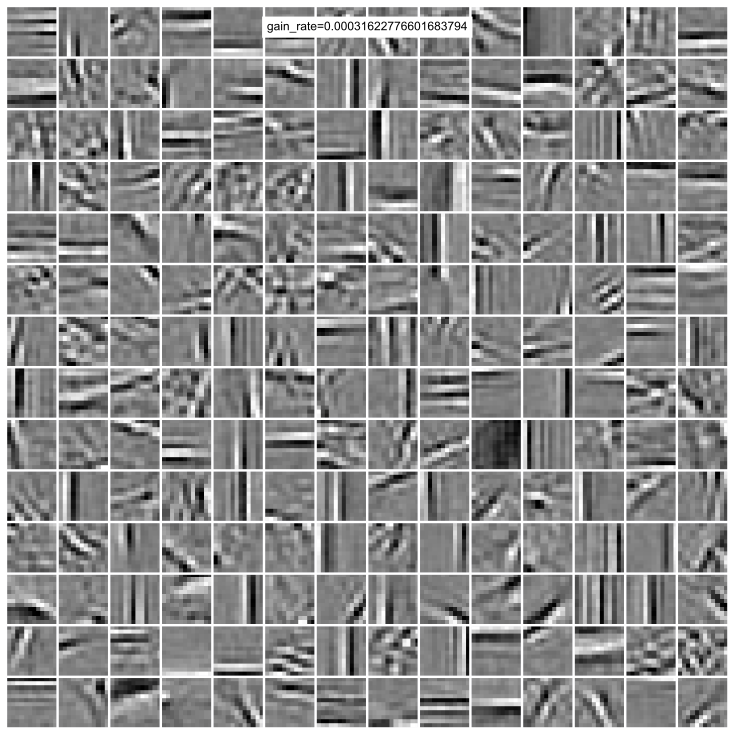

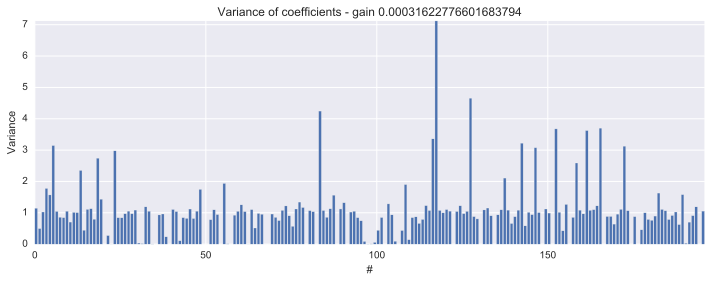

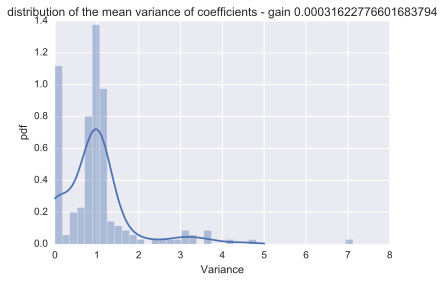

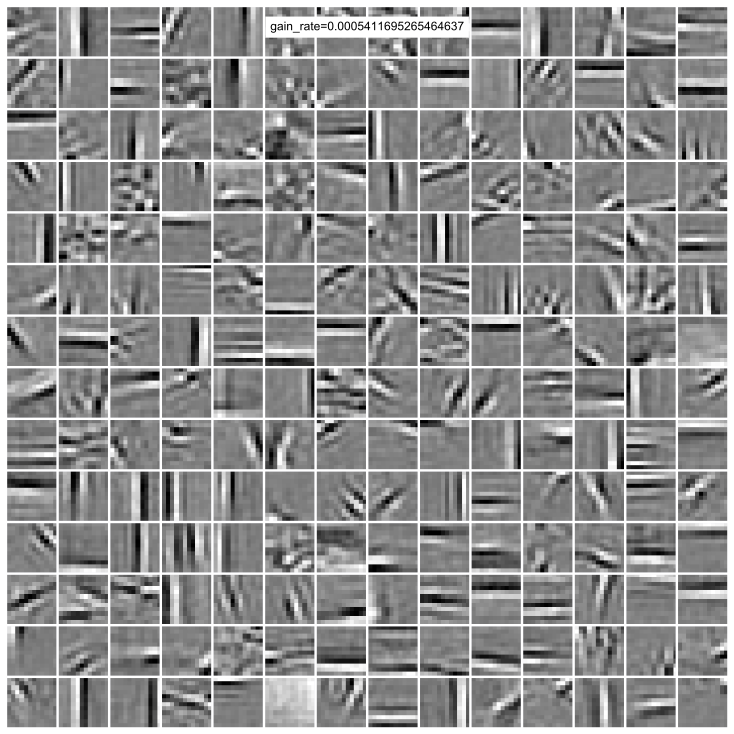

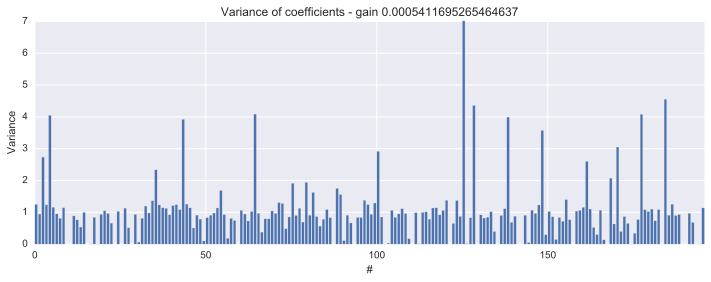

...

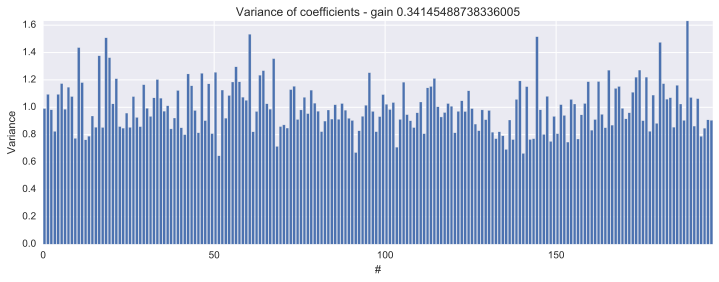

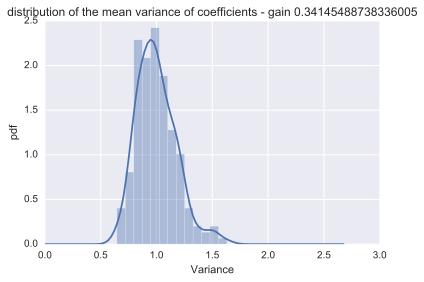

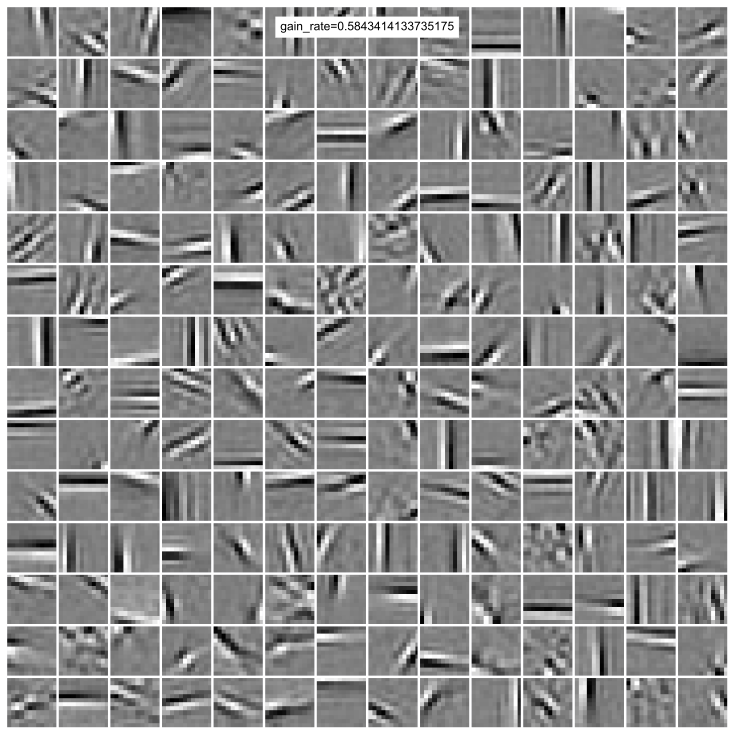

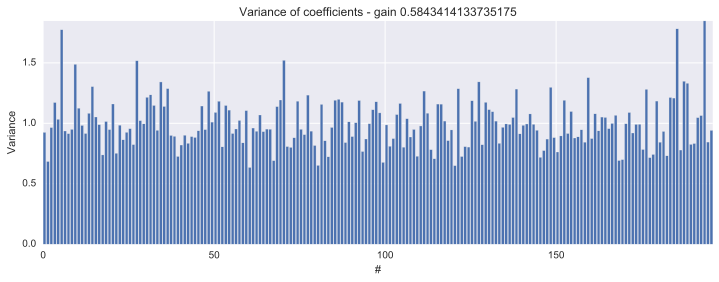

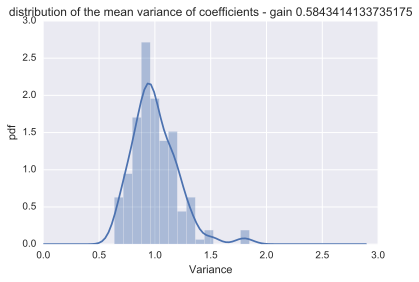

In [11]:
from shl_scripts import SHL
DEBUG_DOWNSCALE, verbose = 1, 0

for gain_rate in np.logspace(-3.5, 0, int(15/(DEBUG_DOWNSCALE)**.3), base=10, endpoint=False):
    shl = SHL(database=database, DEBUG_DOWNSCALE=DEBUG_DOWNSCALE, eta_homeo=gain_rate, verbose=verbose)
    dico = shl.learn_dico()
    fig, ax = shl.show_dico(dico, title='gain_rate={}'.format(gain_rate))
    fig.show()
    data = shl.get_data()
    dico.set_params(transform_algorithm='omp', transform_n_nonzero_coefs=shl.transform_n_nonzero_coefs)
    code = dico.transform(data)
    n_components, n_samples = code.shape
    Z = np.mean(code**2)
    fig = plt.figure(figsize=(12, 4))
    ax = fig.add_subplot(111)
    ax.bar(np.arange(shl.n_components), np.mean(code**2, axis=0)/Z)
    ax.set_title('Variance of coefficients - gain {}'.format(gain_rate))
    ax.set_ylabel('Variance')
    ax.set_xlabel('#')      
    ax.axis('tight')
    fig.show()
    fig = plt.figure(figsize=(6, 4))
    ax = fig.add_subplot(111)
    data = pd.DataFrame(np.mean(code**2, axis=0)/np.mean(code**2), columns=['Variance'])
    with sns.axes_style("white"):
        ax = sns.distplot(data['Variance'],  kde_kws={'clip':(0., 5.)})
    ax.set_title('distribution of the mean variance of coefficients - gain {}'.format(gain_rate))
    ax.set_ylabel('pdf')
    fig.show()

/Users/lolo/pool/libs/numbers/scikit-learn-sparsenet/sklearn/decomposition/dict_learning.py:152: RuntimeWarning:  Orthogonal matching pursuit ended prematurely due to linear
dependence in the dictionary. The requested precision might not have been met.

  copy_Xy=copy_cov).T


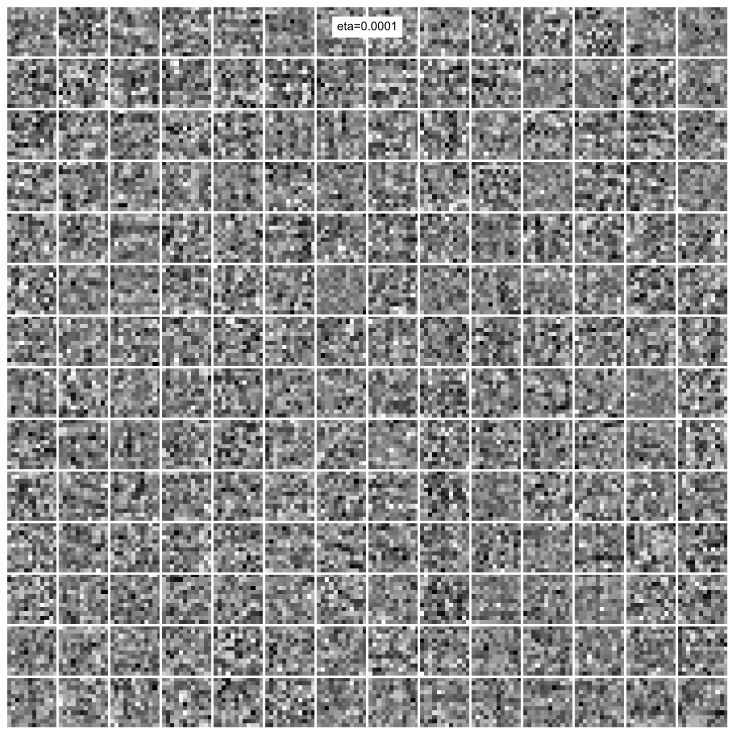

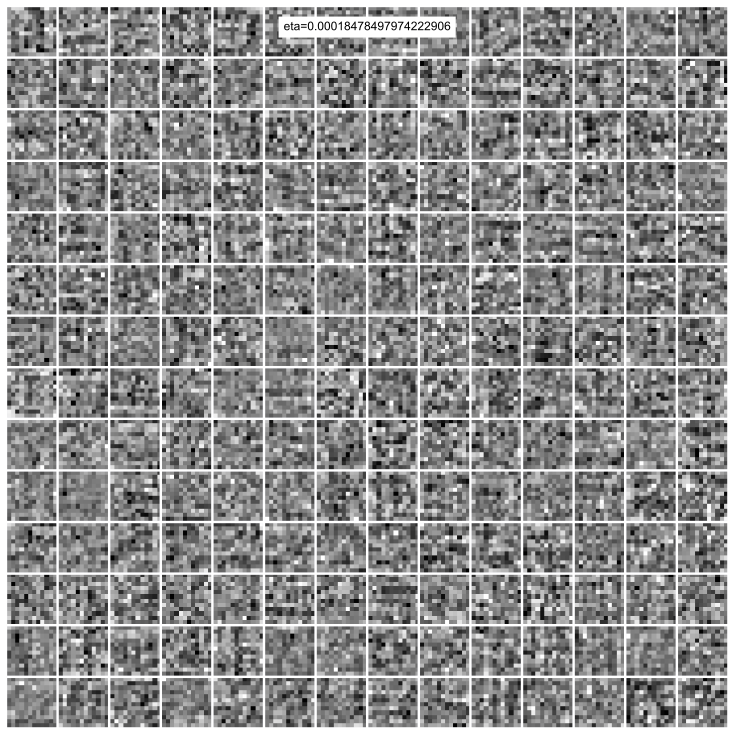

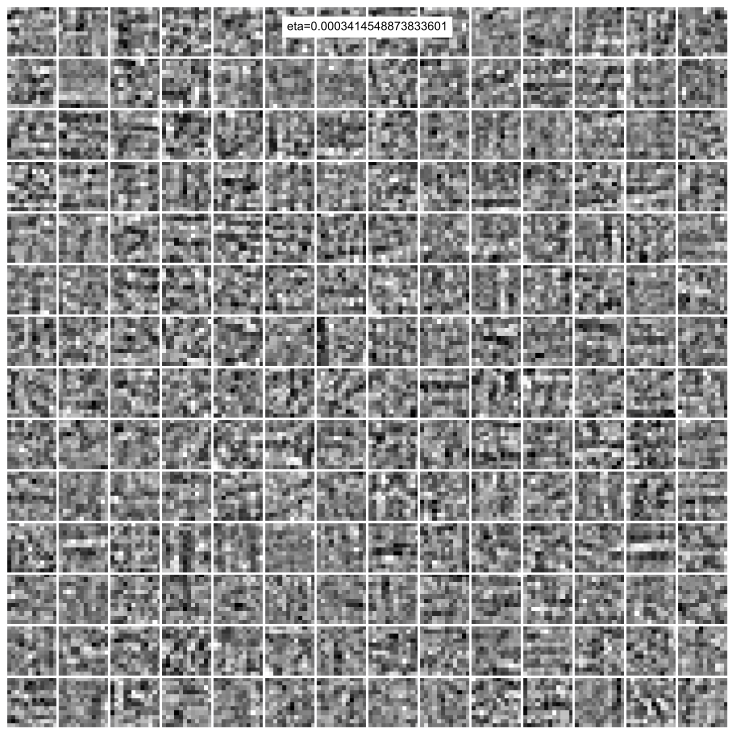

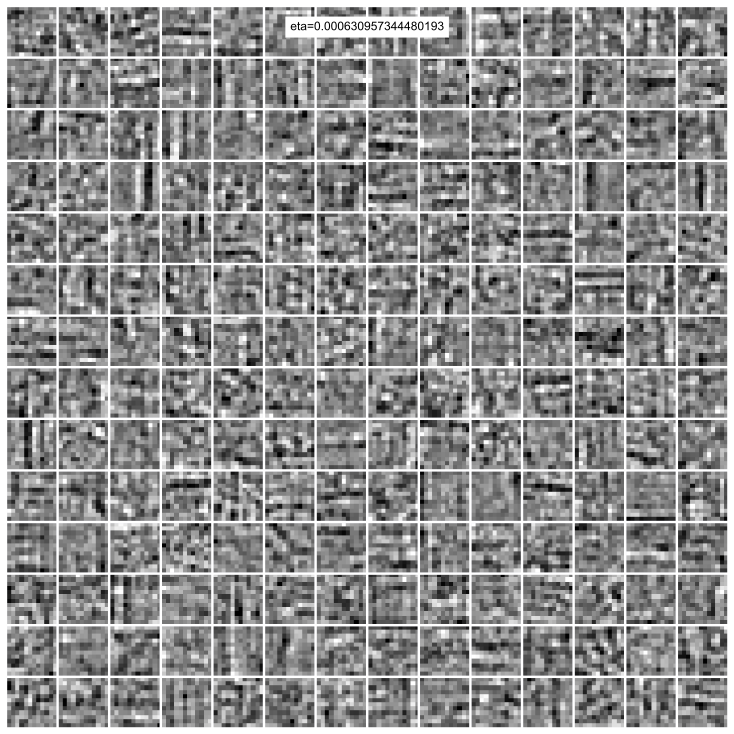

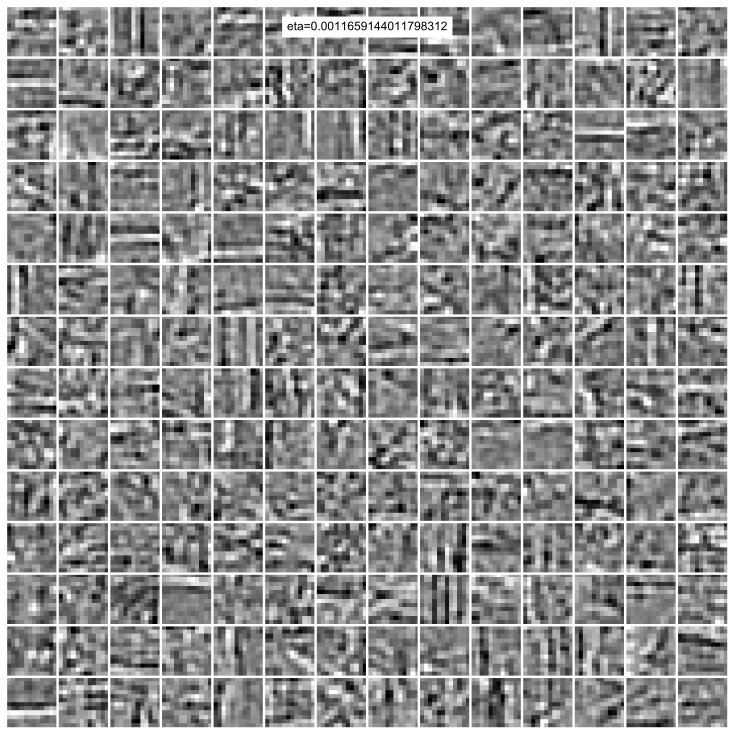

...

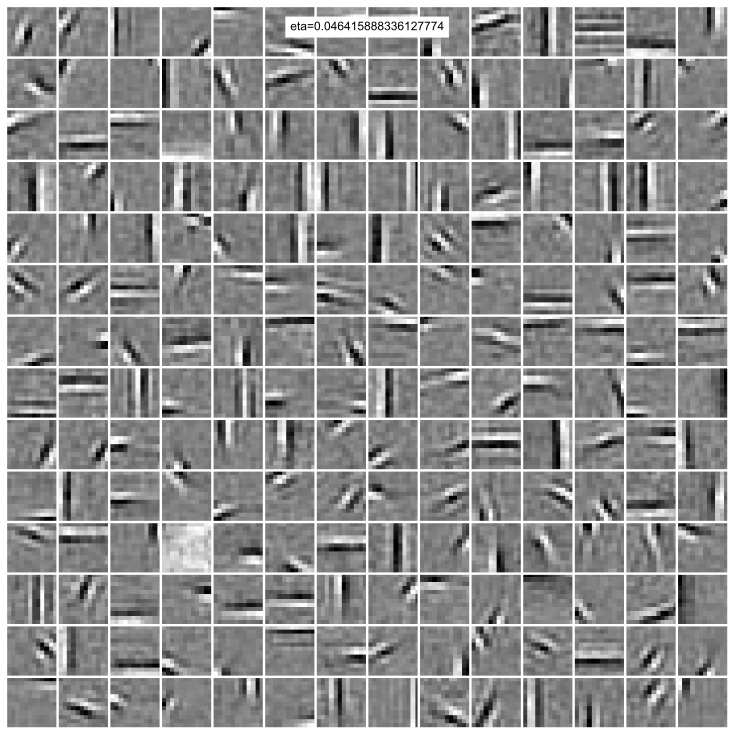

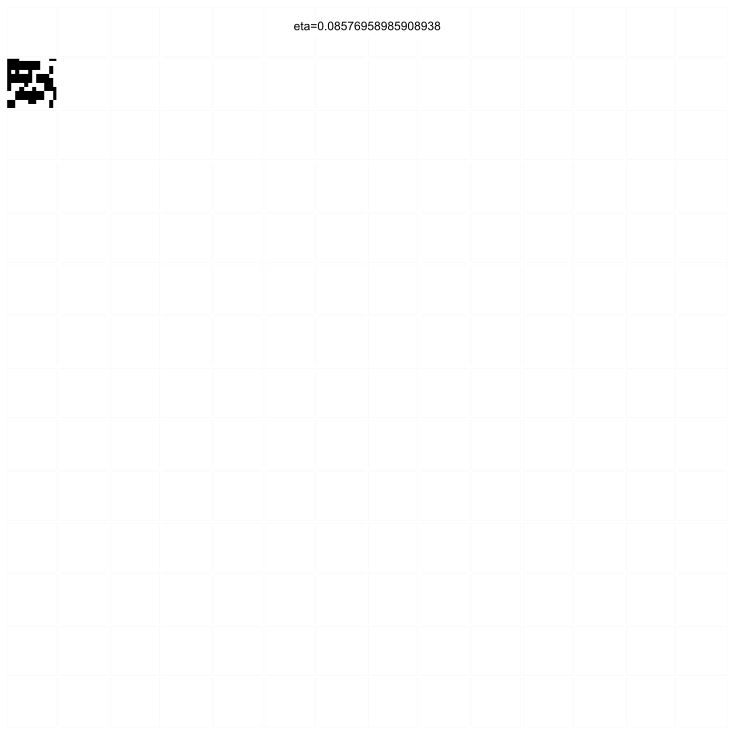

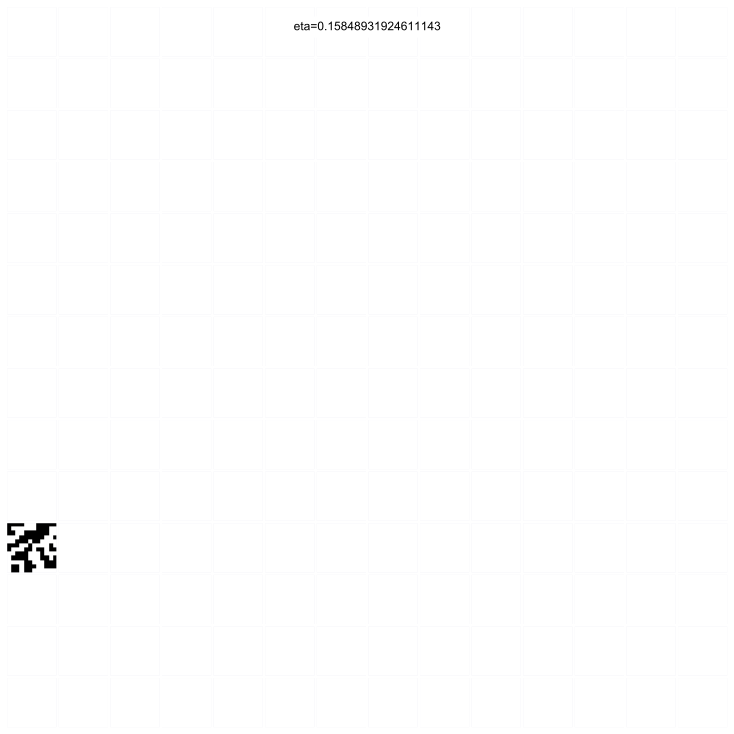

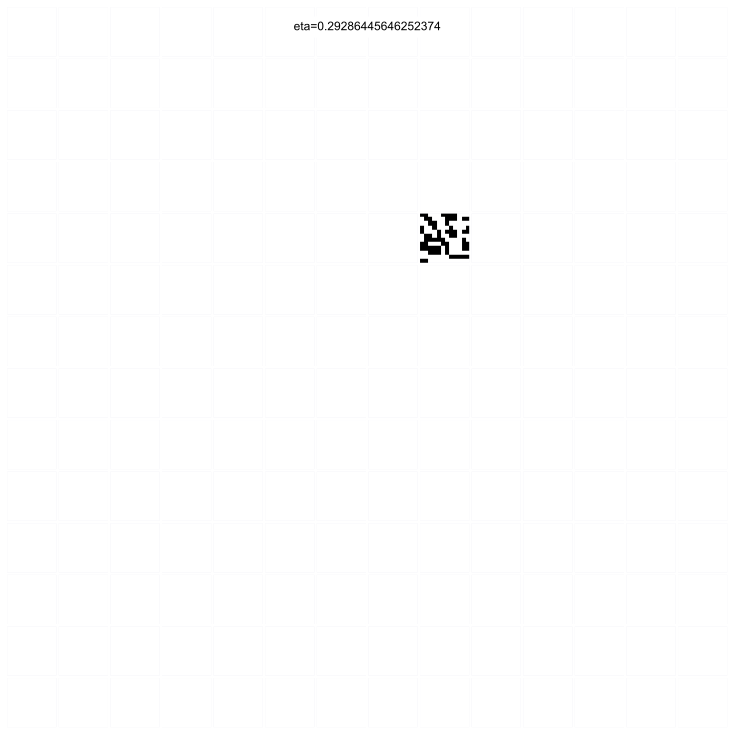

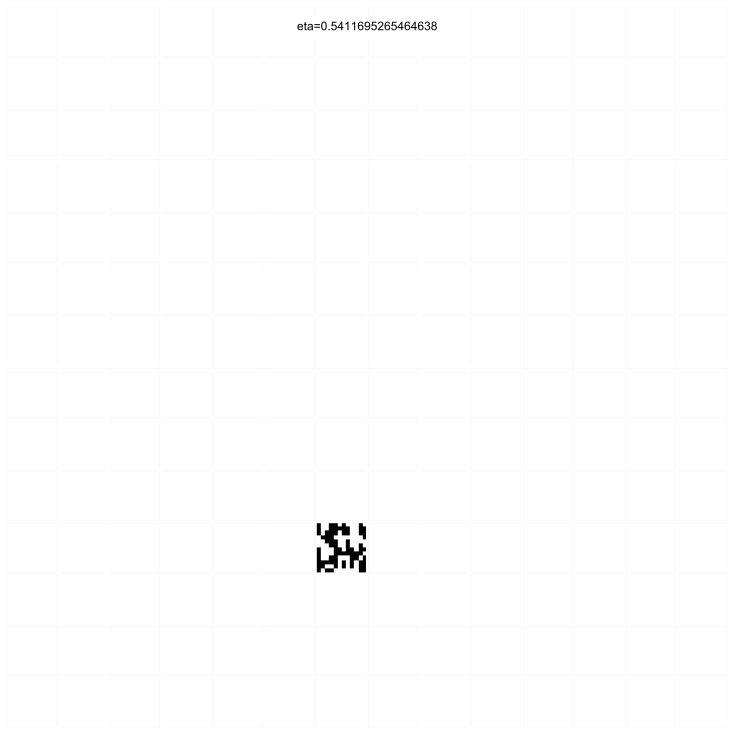

In [12]:
from shl_scripts import SHL

for eta in np.logspace(-4, 0, int(15/(DEBUG_DOWNSCALE)**.3), base=10, endpoint=False):
    shl = SHL(database=database, DEBUG_DOWNSCALE=DEBUG_DOWNSCALE, eta=eta, verbose=verbose)
    dico = shl.learn_dico()
    fig, ax = shl.show_dico(dico, title='eta={}'.format(eta))
    fig.show()

## conclusion

When introducing the homeostasis from Olshausen in ``sklearn``'s dictionary learning, the filters converge faster to a set of edge filters.